In [1]:
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten,Lambda
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.optimizers import SGD, Adadelta, Adagrad
from keras.utils import np_utils, generic_utils
from keras.callbacks import EarlyStopping
from keras.layers.advanced_activations import PReLU, LeakyReLU
from keras.layers import Embedding,GRU,TimeDistributed,RepeatVector,Merge
from keras.preprocessing.text import one_hot
from keras.preprocessing import sequence
import numpy as np
from keras import backend as K
from keras.models import Sequential,Model
from keras.layers.core import Dense, Dropout, Activation, Flatten, MaxoutDense
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.optimizers import SGD, Adadelta, Adagrad
from keras.utils import np_utils, generic_utils
from keras.callbacks import EarlyStopping
from keras.layers.advanced_activations import PReLU, LeakyReLU
from keras.layers import Embedding,GRU,TimeDistributed,RepeatVector,Merge,Input,merge,UpSampling2D
import cv2
from os import listdir
from os.path import isfile, join

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import re
from numpy.random import random, permutation, randn, normal 
import PIL.Image
import os
import json
from tqdm import tqdm



from keras.optimizers import SGD, RMSprop, Adam

import cPickle as pickle
from matplotlib import pyplot as plt

from itertools import compress

import shutil
import string

import collections
import bcolz
import cPickle as pickle

from random import shuffle

# import cv2

Using Theano backend.
Using gpu device 0: GeForce GTX 1080 (CNMeM is disabled, cuDNN 5110)
/opt/conda/lib/python2.7/site-packages/theano/sandbox/cuda/__init__.py:600: UserWarning: Your cuDNN version is more recent than the one Theano officially supports. If you see any problems, try updating Theano or downgrading cuDNN to version 5.
  warnings.warn(warn)


In [2]:
def load_array(fname):
    return bcolz.open(fname)[:]

def load_obj(path):
    with open(path, 'rb') as f:
        return pickle.load(f)
    
def normalize_imgs(data):
    
    data = data.astype('float32')

    mean = np.mean(data)  # mean for data centering
    std = np.std(data)  # std for data normalization

    data -= mean
    data /= std
    
    return data

def scale_masks(data):
    data = data.astype('float32')
    data /= 255.  # scale masks to [0, 1]
    
    return data


def rotate_bound2(image,angle):
    # grab the dimensions of the image and calculate the center
    # of the image
    (h, w) = image.shape[:2]
    center = (w / 2, h / 2)

    # rotate the image by 180 degrees
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    
    return rotated


In [40]:
from skimage.transform import (hough_line, hough_line_peaks,
                               probabilistic_hough_line)

def get_no_hood_img(img):
    
    width,height = img.size
    
    new_heights = [height*(2.0)/4, height*(2.0)/3, height*(4.0)/5]
    
    cropped_imgs = []
    img_averages = []
    
    for new_height in new_heights:
        cropped_img = np.asarray(img.crop((0,new_height,width,height)))
        cropped_imgs.append(cropped_img)
        
        img_avg = np.average(cropped_img)
        img_averages.append(img_avg)
        
    threshold = 70
    
    chosen_index = -1
    
    for index in range(3):
        
        if(img_averages[index] < threshold):
            new_height = new_heights[chosen_index]
            without_road = img.crop((0,0,width,new_height))
            return without_road
    
    return img
   
def line(p1, p2):
    A = (p1[1] - p2[1])
    B = (p2[0] - p1[0])
    C = (p1[0]*p2[1] - p2[0]*p1[1])
    return A, B, -C

def intersection(L1, L2):
    D  = L1[0] * L2[1] - L1[1] * L2[0]
    Dx = L1[2] * L2[1] - L1[1] * L2[2]
    Dy = L1[0] * L2[2] - L1[2] * L2[0]
    if D != 0:
        x = Dx / D
        y = Dy / D
        return x,y
    else:
        return False

    
def auto_canny(image, sigma=0.33):
    v = np.median(image)

    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    
    edged = cv2.Canny(image, lower, upper)

    return edged


def get_vp_img_based_on_haugh(original_image):
    
    original_image_width, original_image_height = original_image.size
        
    resized_img = original_image.resize((448,448), PIL.Image.NEAREST)
    _,resized_img_height = resized_img.size
    
    resized_img = np.asarray(resized_img)
    canny_img = auto_canny(resized_img)
        
    h, theta, d = hough_line(canny_img)
    
    peaks = None
    try:
        peaks = zip(*hough_line_peaks(h, theta, d,threshold=25))
    except Exception as err:
        print err
        return original_image
    
    nr_peaks = 2
    
    if(len(peaks) < nr_peaks):
        return original_image
    
    lines = []
    
    for _, angle, dist in peaks[:nr_peaks]:
        y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
        y1 = (dist - canny_img.shape[1] * np.cos(angle)) / np.sin(angle)
        
        lines.append(([0,y0],[canny_img.shape[1],y1]))
      
    L1 = line(lines[0][0],lines[0][1])
    L2 = line(lines[1][0],lines[1][1])
    
    R = intersection(L1, L2)
    
    if (not R):
        return original_image
    
    new_height = max(0,int(R[1]))
    new_height = min(resized_img_height,new_height)

    height_percentage = float(new_height) / resized_img_height
    
    if(height_percentage == 1):
        return original_image
    
    original_img_new_height = int(original_image_height * height_percentage)
    
    return original_image.crop((0,original_img_new_height,original_image_width,original_image_height))


In [4]:
img_path = "./dataset/training/image_2"
label_path = "./dataset/training/gt_image_2"

In [5]:
img_names = [name for name in os.listdir(img_path) if not name.startswith("um_lane")]
label_names = [name for name in os.listdir(label_path) if not name.startswith("um_lane")]

img_names.sort()
label_names.sort()

In [6]:
len(img_names),len(label_names)

(289, 289)

In [7]:
label_names[:10]

['um_road_000000.png',
 'um_road_000001.png',
 'um_road_000002.png',
 'um_road_000003.png',
 'um_road_000004.png',
 'um_road_000005.png',
 'um_road_000006.png',
 'um_road_000007.png',
 'um_road_000008.png',
 'um_road_000009.png']

In [8]:
img_data = []
label_data = []

new_size = (448,448)

for img_name in tqdm(img_names):
    full_img_path = img_path + "/" + img_name

    img = PIL.Image.open(full_img_path).resize(new_size, PIL.Image.NEAREST)

    img_data.append(img)

for label_name in tqdm(label_names):
    full_label_path = label_path + "/" + label_name

    label = PIL.Image.open(full_label_path).resize(new_size, PIL.Image.NEAREST)

    label_data.append(label)

img_data = np.stack(img_data)
label_data = np.stack(label_data)[...,2]

print(img_data.shape)
print(label_data.shape)

100%|██████████| 289/289 [00:01<00:00, 209.74it/s]


(289, 448, 448, 3)
(289, 448, 448)


In [9]:
imgs_flipped = np.stack([cv2.flip(img,1) for img in img_data])
masks_flipped = np.stack([cv2.flip(mask,1) for mask in label_data])

imgs_rotated_cw = np.stack([rotate_bound2(img,10) for img in tqdm(img_data)])
masks_rotated_cw = np.stack([rotate_bound2(mask,10) for mask in tqdm(label_data)])

imgs_rotated_ccw = np.stack([rotate_bound2(img,350) for img in tqdm(img_data)])
masks_rotated_ccw = np.stack([rotate_bound2(mask,350) for mask in tqdm(label_data)])


100%|██████████| 289/289 [00:00<00:00, 1236.65it/s]


In [10]:
# for i in range(30):

#     nr_cols = 8
#     plt.subplot(1,nr_cols,1)
#     plt.imshow(img_data[i])
    
#     plt.subplot(1,nr_cols,2)
#     plt.imshow(label_data[i])

#     plt.subplot(1,nr_cols,3)
#     plt.imshow(imgs_rotated_cw[i])

#     plt.subplot(1,nr_cols,4)
#     plt.imshow(masks_rotated_cw[i])

#     plt.subplot(1,nr_cols,5)
#     plt.imshow(imgs_rotated_ccw[i])

#     plt.subplot(1,nr_cols,6)
#     plt.imshow(masks_rotated_ccw[i])

#     plt.subplot(1,nr_cols,7)
#     plt.imshow(imgs_flipped[i])

#     plt.subplot(1,nr_cols,8)
#     plt.imshow(masks_flipped[i])

#     plt.figure(figsize=(10,10))

# plt.show()

In [11]:
img_data = np.vstack([img_data, imgs_flipped, imgs_rotated_cw, imgs_rotated_ccw])
label_data = np.vstack([label_data, masks_flipped, masks_rotated_cw, masks_rotated_ccw])

img_data_norm = normalize_imgs(img_data)
label_data = scale_masks(label_data)

print(img_data.shape)
print(label_data.shape)

(1156, 448, 448, 3)
(1156, 448, 448)


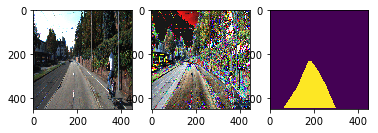

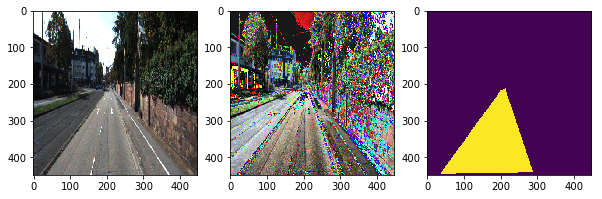

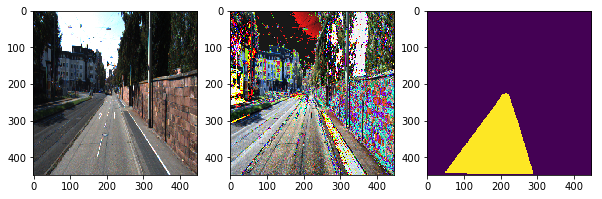

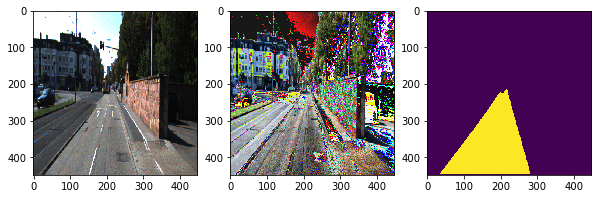

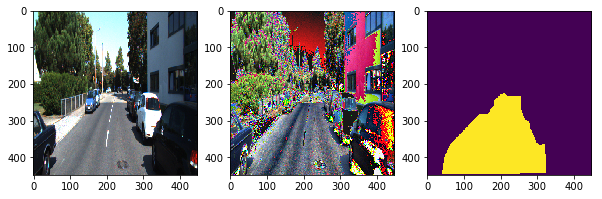

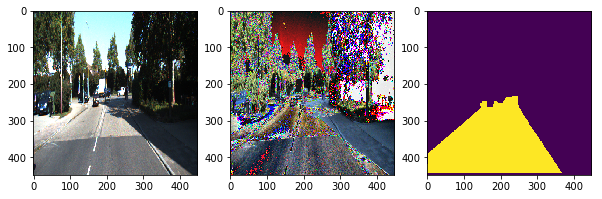

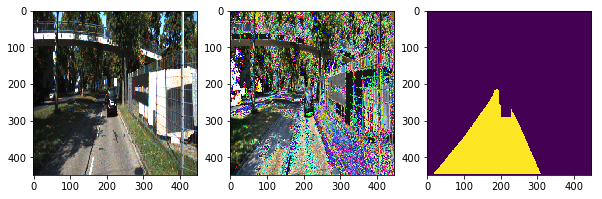

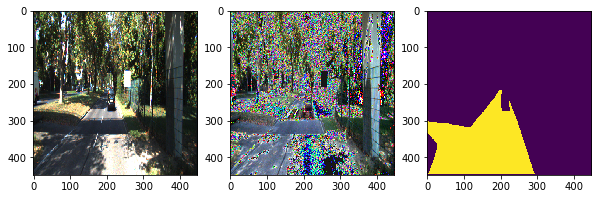

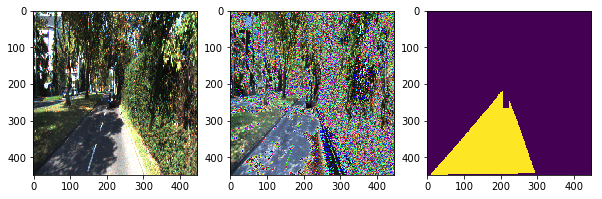

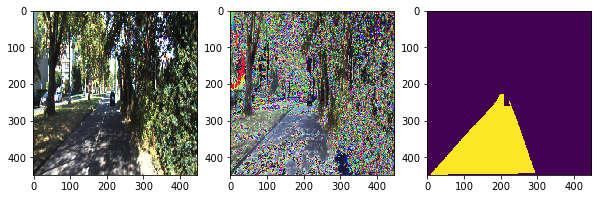

In [15]:
for i in range(10):

    nr_cols = 3
    plt.subplot(1,nr_cols,1)
    plt.imshow(img_data[i])
    
    plt.subplot(1,nr_cols,2)
    plt.imshow(img_data_norm[i])
    
    plt.subplot(1,nr_cols,3)
    plt.imshow(label_data[i])


    plt.figure(figsize=(10,10))

plt.show()

In [12]:
def get_unet(img_rows, img_cols):
    
    inputs = Input((3, img_rows, img_cols))
    conv1 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(inputs)
    conv1 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(pool1)
    conv2 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(pool2)
    conv3 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(pool3)
    conv4 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Convolution2D(512, 3, 3, activation='relu', border_mode='same')(pool4)
    conv5 = Convolution2D(512, 3, 3, activation='relu', border_mode='same')(conv5)

    up6 = merge([UpSampling2D(size=(2, 2))(conv5), conv4], mode='concat', concat_axis=1)
    conv6 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(up6)
    conv6 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(conv6)

    up7 = merge([UpSampling2D(size=(2, 2))(conv6), conv3], mode='concat', concat_axis=1)
    conv7 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(up7)
    conv7 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(conv7)

    up8 = merge([UpSampling2D(size=(2, 2))(conv7), conv2], mode='concat', concat_axis=1)
    conv8 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(up8)
    conv8 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(conv8)

    up9 = merge([UpSampling2D(size=(2, 2))(conv8), conv1], mode='concat', concat_axis=1)
    conv9 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(up9)
    conv9 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(conv9)

    conv10 = Convolution2D(1, 1, 1, activation='sigmoid')(conv9)

    model = Model(input=inputs, output=conv10)
    
    model.compile(optimizer=Adam(lr=0.0001),loss='categorical_crossentropy')
    return model

In [13]:
model = get_unet(448,448)

In [14]:
img_data_format = np.transpose(img_data_norm,(0,3,1,2))
label_data_format = np.transpose(np.expand_dims(label_data,axis=3),(0,3,1,2))

print(img_data_format.shape)
print(label_data_format.shape)

(1156, 3, 448, 448)
(1156, 1, 448, 448)


In [ ]:
# NR_TRAIN = 200

# train_imgs_format = img_data_format[:NR_TRAIN]
# train_labels_format = label_data_format [:NR_TRAIN]

# test_imgs_format = img_data_format[NR_TRAIN:]
# test_labels_format = label_data_format [NR_TRAIN:]

# print(train_imgs_format.shape)
# print(train_labels_format.shape)

# print(test_imgs_format.shape)
# print(test_labels_format.shape)


In [68]:
model.fit(img_data_format, 
          label_data_format, 
          batch_size=8, 
          nb_epoch=5
#           validation_data = (test_imgs_format,test_labels_format)
         )

Epoch 1/5
1156/1156 [==============================] - 231s - loss: 414.4117     

In [36]:
model.save_weights("./drivable-area-15e.h5")

# model.load_weights("./drivable-area-20e.h5")

In [37]:
preds = model.predict(img_data_format[:50])
preds.shape

(50, 1, 448, 448)

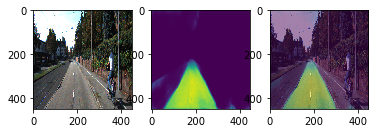

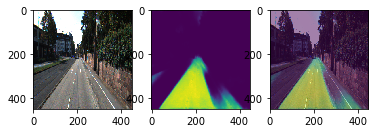

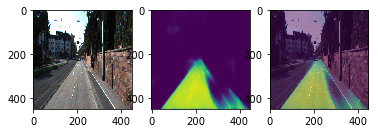

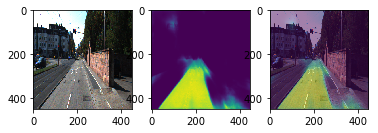

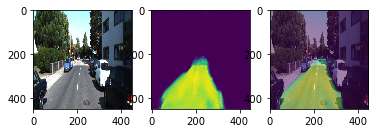

...

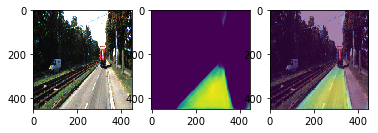

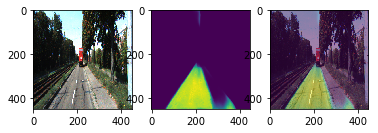

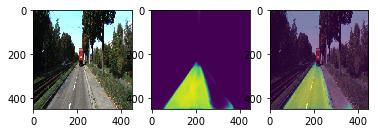

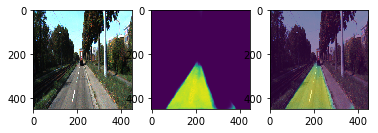

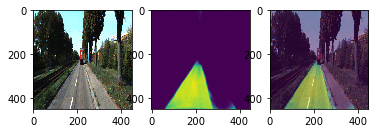

In [38]:
for i in range(len(preds)):
    
    current_img = img_data[i]
    current_pred = np.squeeze(preds)[i]
                    
    plt.subplot(1,3,1)
    plt.imshow(current_img)

    plt.subplot(1,3,2)
    plt.imshow(current_pred)
    
    plt.subplot(1,3,3)
    plt.imshow(current_img)
    plt.imshow(current_pred, alpha=0.5)
    
    plt.figure()

plt.show()

# OSC

In [59]:
def read_image(img_path,new_img_size):
    img = PIL.Image.open(img_path)

#     img = correct_image_rotation(img)
        
    img = get_no_hood_img(img) #hood extraction
    
    img = get_vp_img_based_on_haugh(img) # sky extraction
    
    img = img.resize(new_img_size, PIL.Image.NEAREST)
    
    img = np.asarray(img)
    
    return img

In [60]:
base_path = "../lanes/hood-osc/"
img_paths = os.listdir(base_path)
                        
raw_osc_images = [read_image(base_path+img_path,(448,448)) for img_path in tqdm(img_paths[:100])]

100%|██████████| 100/100 [00:20<00:00,  4.74it/s]


In [61]:
# osc_images = [img[img.shape[1] / 2:,...] for img in raw_osc_images]
# print(len(osc_images))
resized_osc_images = raw_osc_images

In [62]:
# resized_osc_images =  np.stack([np.asarray(PIL.Image.fromarray(current_data).resize((448, 448), PIL.Image.NEAREST)) 
#                         for current_data in tqdm(osc_images)])

# resized_osc_images.shape

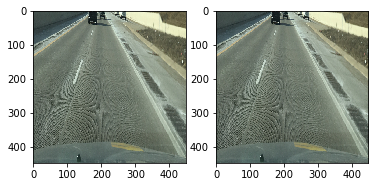

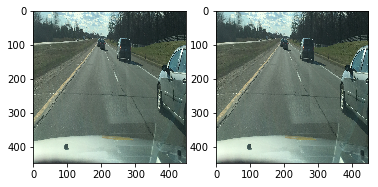

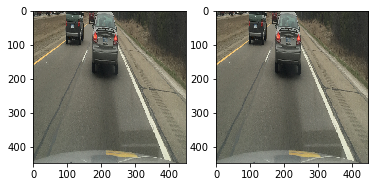

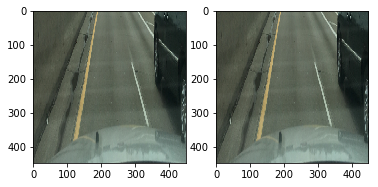

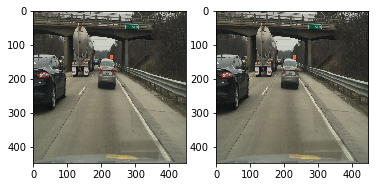

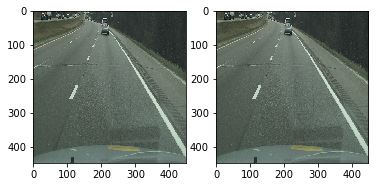

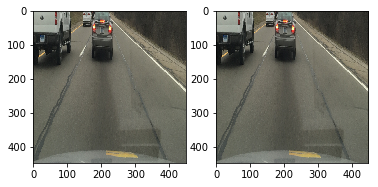

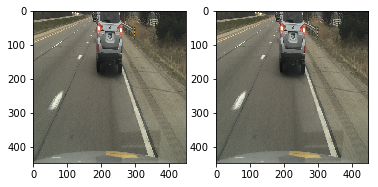

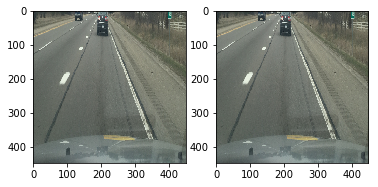

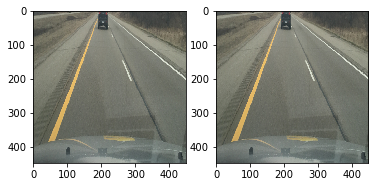

In [63]:
for i in range(10):
    
    original = raw_osc_images[i]
    current_data = resized_osc_images[i]
    
    plt.subplot(1,2,1)
    plt.imshow(original)

    plt.subplot(1,2,2)
    plt.imshow(current_data)
    plt.figure()

plt.show()

In [25]:
# osc_images = normalize_imgs(osc_images)

In [64]:
osc_images_norm = normalize_imgs(np.asarray(resized_osc_images))

In [65]:
osc_images_format = np.transpose(osc_images_norm,(0,3,1,2))
# osc_images_format = np.transpose(resized_osc_images,(0,3,1,2))

osc_images_format.shape

(100, 3, 448, 448)

In [66]:
osc_preds = model.predict(osc_images_format,batch_size = 4, verbose=1)

100/100 [==============================] - 5s     

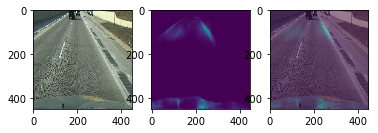

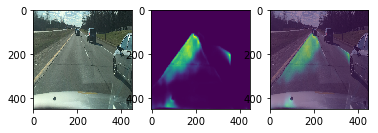

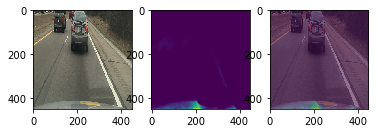

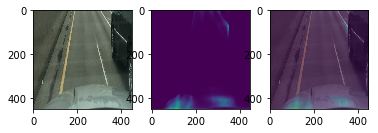

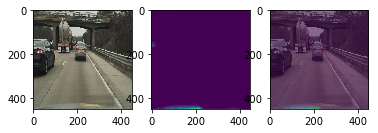

...

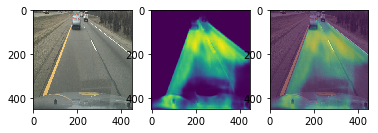

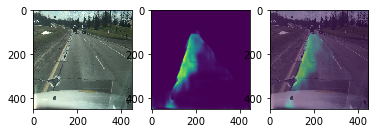

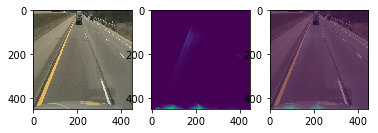

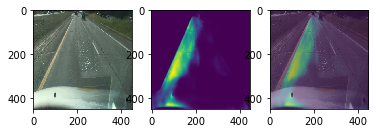

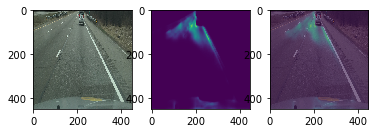

In [67]:
for i in range(len(osc_preds)):
    
    current_img = resized_osc_images[i]
    current_pred = np.squeeze(osc_preds)[i]
                    
    plt.subplot(1,3,1)
    plt.imshow(current_img)

    plt.subplot(1,3,2)
    plt.imshow(current_pred)
    
    plt.subplot(1,3,3)
    plt.imshow(current_img)
    plt.imshow(current_pred, alpha=0.5)
    
    plt.figure()

plt.show()